# Setup

Clone repo, install dependencies and check PyTorch and GPU.

In [1]:
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
%pip install -qr requirements.txt  # install

import torch
from yolov5 import utils
display = utils.notebook_init()  # checks

YOLOv5 🚀 v6.0-159-gdb6ec66 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 42.0/78.2 GB disk)


# 1. Inference

`detect.py` runs YOLOv5 inference on a variety of sources, downloading models automatically from the [latest YOLOv5 release](https://github.com/ultralytics/yolov5/releases), and saving results to `runs/detect`. Example inference sources are:

```shell
python detect.py --source 0  # webcam
                          img.jpg  # image 
                          vid.mp4  # video
                          path/  # directory
                          path/*.jpg  # glob
                          'https://youtu.be/Zgi9g1ksQHc'  # YouTube
                          'rtsp://example.com/media.mp4'  # RTSP, RTMP, HTTP stream
```

detect: weights=['yolov5s.pt'], source=data/images, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-159-gdb6ec66 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

100% 14.0M/14.0M [00:00<00:00, 64.7MB/s]

Fusing layers... 
Model Summary: 213 layers, 7225885 parameters, 0 gradients
image 1/2 /content/yolov5/data/images/bus.jpg: 640x480 4 persons, 1 bus, Done. (0.032s)
image 2/2 /content/yolov5/data/images/zidane.jpg: 384x640 2 persons, 1 tie, Done. (0.028s)
Speed: 0.6ms pre-process, 30.0ms inference, 23.8ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp


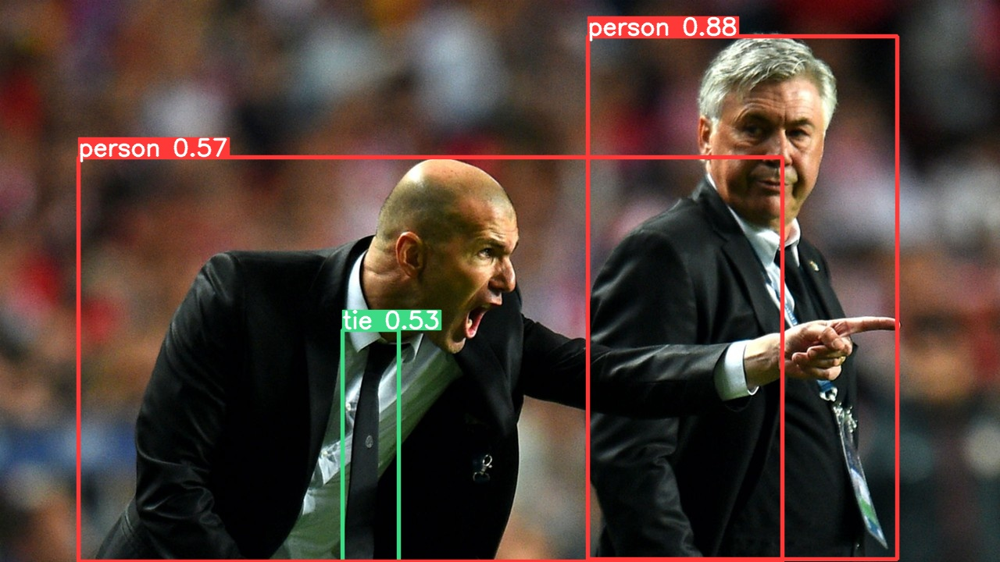

In [2]:
!python detect.py --weights yolov5s.pt --img 640 --conf 0.25 --source data/images
display.Image(filename='runs/detect/exp/zidane.jpg', width=600)

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;
<img align="left" src="https://user-images.githubusercontent.com/26833433/127574988-6a558aa1-d268-44b9-bf6b-62d4c605cc72.jpg" width="600">

# 2. Validate
Validate a model's accuracy on [COCO](https://cocodataset.org/#home) val or test-dev datasets. Models are downloaded automatically from the [latest YOLOv5 release](https://github.com/ultralytics/yolov5/releases). To show results by class use the `--verbose` flag. Note that `pycocotools` metrics may be ~1% better than the equivalent repo metrics, as is visible below, due to slight differences in mAP computation.

## COCO val
Download [COCO val 2017](https://github.com/ultralytics/yolov5/blob/74b34872fdf41941cddcf243951cdb090fbac17b/data/coco.yaml#L14) dataset (1GB - 5000 images), and test model accuracy.

In [3]:
# Download COCO val
torch.hub.download_url_to_file('https://ultralytics.com/assets/coco2017val.zip', 'tmp.zip')
!unzip -q tmp.zip -d ../datasets && rm tmp.zip

  0%|          | 0.00/780M [00:00<?, ?B/s]

In [4]:
# Run YOLOv5s on COCO val
!python val.py --weights yolov5s.pt --data coco.yaml --img 640 --iou 0.65 --half

val: data=/content/yolov5/data/coco.yaml, weights=['yolov5s.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.65, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=True, project=runs/val, name=exp, exist_ok=False, half=True, dnn=False
YOLOv5 🚀 v6.0-159-gdb6ec66 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model Summary: 213 layers, 7225885 parameters, 0 gradients
val: Scanning '../datasets/coco/val2017' images and labels...4952 found, 48 missing, 0 empty, 0 corrupted: 100% 5000/5000 [00:03<00:00, 1393.73it/s]
val: New cache created: ../datasets/coco/val2017.cache
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 157/157 [02:47<00:00,  1.07s/it]
                 all       5000      36335       0.68      0.498      0.553      0.359
Speed: 0.3ms pre-process, 21.9ms inference, 3.7ms NMS per image at shape (32, 3, 640, 640)

E

## COCO test
Download [COCO test2017](https://github.com/ultralytics/yolov5/blob/74b34872fdf41941cddcf243951cdb090fbac17b/data/coco.yaml#L15) dataset (7GB - 40,000 images), to test model accuracy on test-dev set (**20,000 images, no labels**). Results are saved to a `*.json` file which should be **zipped** and submitted to the evaluation server at https://competitions.codalab.org/competitions/20794.

# 4. Visualize

In [21]:
# Tensorboard  (optional)
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [22]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
# Weights & Biases  (optional)
%pip install -q wandb
import wandb
wandb.login()

<IPython.core.display.Javascript object>

wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

wandb: Currently logged in as: fahlevi20 (use `wandb login --relogin` to force relogin)


True

In [7]:
%cd yolov5
import torch
from yolov5 import utils
display = utils.notebook_init()

YOLOv5 🚀 v6.0-159-gdb6ec66 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 42.9/78.2 GB disk)


In [19]:
# Train YOLOv5s on COCO128 for 3 epochs
!python train.py --img 640 --batch 16 --epochs 3 --data coco128.yaml --weights yolov5s.pt --cache

wandb: Currently logged in as: fahlevi20 (use `wandb login --relogin` to force relogin)
train: weights=yolov5s.pt, cfg=, data=coco128.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=3, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.0-159-gdb6ec66 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_

In [9]:
!gdown --id 1XNRNr5rhGeQBGeDxkBL7Wwz5jbGWSmzM
!gdown --id 1Qf4T5e75RjUCI37qCArrkF18GRJNKUta

Downloading...
From: https://drive.google.com/uc?id=1XNRNr5rhGeQBGeDxkBL7Wwz5jbGWSmzM
To: /content/yolov5/input1.mp4
100% 34.2M/34.2M [00:00<00:00, 160MB/s]
Downloading...
From: https://drive.google.com/uc?id=1Qf4T5e75RjUCI37qCArrkF18GRJNKUta
To: /content/yolov5/input2.mp4
100% 10.1M/10.1M [00:00<00:00, 32.1MB/s]


In [11]:
!python detect.py --weights yolov5s.pt --img 640 --conf 0.25 --source input1.mp4

detect: weights=['yolov5s.pt'], source=input1.mp4, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-159-gdb6ec66 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model Summary: 213 layers, 7225885 parameters, 0 gradients
video 1/1 (1/937) /content/yolov5/input1.mp4: 384x640 3 cars, Done. (0.029s)
video 1/1 (2/937) /content/yolov5/input1.mp4: 384x640 2 persons, 3 cars, Done. (0.028s)
video 1/1 (3/937) /content/yolov5/input1.mp4: 384x640 1 person, 5 cars, Done. (0.028s)
video 1/1 (4/937) /content/yolov5/input1.mp4: 384x640 2 persons, 5 cars, Done. (0.028s)
video 1/1 (5/937) /content/yolov5/input1.mp4: 384x640 2 persons, 5 cars, Done. (0.028s)
video 1/1 (

In [12]:
!python detect.py --weights yolov5s.pt --img 640 --conf 0.25 --source input2.mp4

detect: weights=['yolov5s.pt'], source=input2.mp4, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-159-gdb6ec66 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model Summary: 213 layers, 7225885 parameters, 0 gradients
video 1/1 (1/307) /content/yolov5/input2.mp4: 384x640 4 persons, 4 cars, 3 motorcycles, Done. (0.029s)
video 1/1 (2/307) /content/yolov5/input2.mp4: 384x640 4 persons, 4 cars, 4 motorcycles, Done. (0.029s)
video 1/1 (3/307) /content/yolov5/input2.mp4: 384x640 5 persons, 4 cars, 3 motorcycles, Done. (0.028s)
video 1/1 (4/307) /content/yolov5/input2.mp4: 384x640 4 persons, 4 cars, 3 motorcycles, Done. (0.028s)
video 1/1 (5/307) /content/

In [20]:
!python detect.py --weights yolov5x.pt --img 640 --conf 0.25 --source input1.mp4

detect: weights=['yolov5x.pt'], source=input1.mp4, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-159-gdb6ec66 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model Summary: 444 layers, 86705005 parameters, 0 gradients
video 1/1 (1/937) /content/yolov5/input1.mp4: 384x640 1 person, 4 cars, Done. (0.193s)
video 1/1 (2/937) /content/yolov5/input1.mp4: 384x640 2 persons, 4 cars, 1 bus, 1 traffic light, Done. (0.193s)
video 1/1 (3/937) /content/yolov5/input1.mp4: 384x640 1 person, 5 cars, 1 bus, 1 traffic light, Done. (0.193s)
video 1/1 (4/937) /content/yolov5/input1.mp4: 384x640 2 persons, 6 cars, 1 fire hydrant, Done. (0.194s)
video 1/1 (5/937) /conte

In [13]:
!python export.py --weights yolov5s.pt --img 640 --include tflite

export: data=data/coco128.yaml, weights=['yolov5s.pt'], imgsz=[640], batch_size=1, device=cpu, half=False, inplace=False, train=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=12, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['tflite']
YOLOv5 🚀 v6.0-159-gdb6ec66 torch 1.10.0+cu111 CPU

Fusing layers... 
Model Summary: 213 layers, 7225885 parameters, 0 gradients

PyTorch: starting from yolov5s.pt (14.7 MB)

TensorFlow saved_model: starting export with tensorflow 2.7.0...

                 from  n    params  module                                  arguments                     
2021-12-26 06:51:09.062693: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
  0                -1  1      3520  models.common.Conv                      [3, 32, 6, 2, 2]              
  1                -1  1     18560 

In [15]:
!python export.py --weights yolov5x.pt --img 640 --include tflite

export: data=data/coco128.yaml, weights=['yolov5x.pt'], imgsz=[640], batch_size=1, device=cpu, half=False, inplace=False, train=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=12, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['tflite']
YOLOv5 🚀 v6.0-159-gdb6ec66 torch 1.10.0+cu111 CPU

100% 166M/166M [00:02<00:00, 73.1MB/s]

Fusing layers... 
Model Summary: 444 layers, 86705005 parameters, 0 gradients

PyTorch: starting from yolov5x.pt (174.0 MB)

TensorFlow saved_model: starting export with tensorflow 2.7.0...

                 from  n    params  module                                  arguments                     
2021-12-26 07:07:14.081672: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
  0                -1  1      8800  models.common.Conv                      [3, 80, 6, 2, 2]        